In [3]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 


In [4]:
birddata=pd.read_csv("bird_tracking.csv")
print(birddata.head())

   Unnamed: 0  altitude               date_time  device_info_serial  \
0           0        71  2013-08-15 00:18:08+00                 851   
1           1        68  2013-08-15 00:48:07+00                 851   
2           2        68  2013-08-15 01:17:58+00                 851   
3           3        73  2013-08-15 01:47:51+00                 851   
4           4        69  2013-08-15 02:17:42+00                 851   

    direction   latitude  longitude  speed_2d bird_name  
0 -150.469753  49.419860   2.120733  0.150000      Eric  
1 -136.151141  49.419880   2.120746  2.438360      Eric  
2  160.797477  49.420310   2.120885  0.596657      Eric  
3   32.769360  49.420359   2.120859  0.310161      Eric  
4   45.191230  49.420331   2.120887  0.193132      Eric  


In [5]:
print(birddata.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61920 entries, 0 to 61919
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          61920 non-null  int64  
 1   altitude            61920 non-null  int64  
 2   date_time           61920 non-null  object 
 3   device_info_serial  61920 non-null  int64  
 4   direction           61477 non-null  float64
 5   latitude            61920 non-null  float64
 6   longitude           61920 non-null  float64
 7   speed_2d            61477 non-null  float64
 8   bird_name           61920 non-null  object 
dtypes: float64(4), int64(3), object(2)
memory usage: 4.3+ MB
None


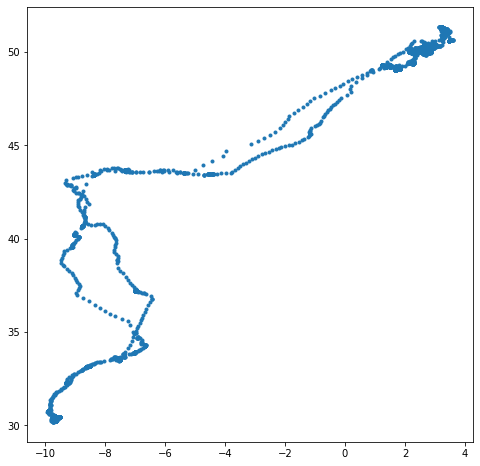

In [6]:
ix=birddata.bird_name=="Eric"
x,y=birddata.longitude[ix],birddata.latitude[ix]
plt.figure(figsize=(8,8))
plt.plot(x,y,".")

In [7]:
bird_names=pd.unique(birddata.bird_name)

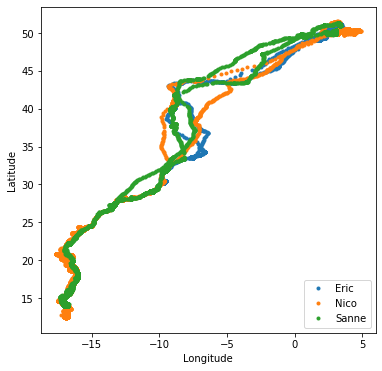

In [9]:
plt.figure(figsize=(6,6))
for bird_name in bird_names:
    ix=birddata.bird_name==bird_name
    x,y=birddata.longitude[ix],birddata.latitude[ix]
    plt.plot(x,y,".",label=bird_name)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc="lower right")
plt.savefig("path of 2 birds.png")

In [10]:
import datetime

In [13]:
timestamps=[]
for k in range(len(birddata)):
    timestamps.append(datetime.datetime.strptime(birddata.date_time.iloc[k][:-3],"%Y-%m-%d %H:%M:%S"))

In [14]:
print(timestamps[1:20])

[datetime.datetime(2013, 8, 15, 0, 48, 7), datetime.datetime(2013, 8, 15, 1, 17, 58), datetime.datetime(2013, 8, 15, 1, 47, 51), datetime.datetime(2013, 8, 15, 2, 17, 42), datetime.datetime(2013, 8, 15, 2, 47, 38), datetime.datetime(2013, 8, 15, 3, 2, 33), datetime.datetime(2013, 8, 15, 3, 17, 27), datetime.datetime(2013, 8, 15, 3, 32, 35), datetime.datetime(2013, 8, 15, 3, 47, 48), datetime.datetime(2013, 8, 15, 4, 3, 39), datetime.datetime(2013, 8, 15, 4, 18, 40), datetime.datetime(2013, 8, 15, 4, 33, 53), datetime.datetime(2013, 8, 15, 4, 49, 6), datetime.datetime(2013, 8, 15, 5, 4, 45), datetime.datetime(2013, 8, 15, 5, 20, 9), datetime.datetime(2013, 8, 15, 5, 35, 4), datetime.datetime(2013, 8, 15, 5, 49, 58), datetime.datetime(2013, 8, 15, 6, 4, 56), datetime.datetime(2013, 8, 15, 6, 19, 54)]


In [15]:
birddata["timestamp"]=pd.Series(timestamps,index=birddata.index)

In [16]:
print(birddata.head)

   Unnamed: 0  altitude               date_time  device_info_serial  \
0           0        71  2013-08-15 00:18:08+00                 851   
1           1        68  2013-08-15 00:48:07+00                 851   
2           2        68  2013-08-15 01:17:58+00                 851   
3           3        73  2013-08-15 01:47:51+00                 851   
4           4        69  2013-08-15 02:17:42+00                 851   

    direction   latitude  longitude  speed_2d bird_name           timestamp  
0 -150.469753  49.419860   2.120733  0.150000      Eric 2013-08-15 00:18:08  
1 -136.151141  49.419880   2.120746  2.438360      Eric 2013-08-15 00:48:07  
2  160.797477  49.420310   2.120885  0.596657      Eric 2013-08-15 01:17:58  
3   32.769360  49.420359   2.120859  0.310161      Eric 2013-08-15 01:47:51  
4   45.191230  49.420331   2.120887  0.193132      Eric 2013-08-15 02:17:42  


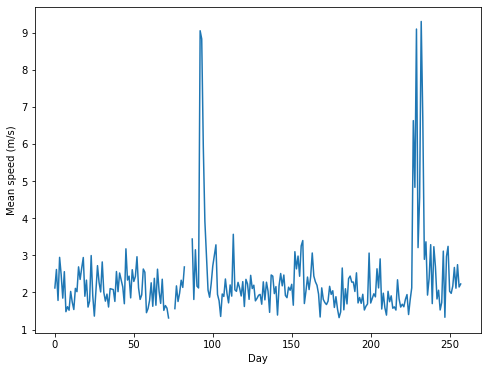

In [23]:
data = birddata[birddata.bird_name == "Eric"]
times = data.timestamp
elapsed_time = [time - times[0] for time in times]
elapsed_days = np.array(elapsed_time) / datetime. timedelta(days=1)
next_day = 1
inds = []
daily_mean_speed = []
for (i,t) in enumerate(elapsed_days):
    if t < next_day:
        inds.append(i)
    else:
        daily_mean_speed.append(np.mean(data.speed_2d[inds]))
        next_day += 1
        inds = []
plt.figure(figsize=(8,6))
plt.plot(daily_mean_speed)
plt.xlabel("Day")
plt.ylabel("Mean speed (m/s)");
plt.savefig("dms.pdf")

In [25]:
dataSanne = birddata[birddata.bird_name == "Sanne"]
print(dataSanne)

       Unnamed: 0  altitude               date_time  device_info_serial  \
40916       40916        55  2013-08-15 00:01:08+00                 833   
40917       40917        54  2013-08-15 00:31:00+00                 833   
40918       40918        55  2013-08-15 01:01:19+00                 833   
40919       40919        56  2013-08-15 01:31:38+00                 833   
40920       40920        55  2013-08-15 02:01:24+00                 833   
...           ...       ...                     ...                 ...   
61915       61915        11  2014-04-30 22:00:08+00                 833   
61916       61916         6  2014-04-30 22:29:57+00                 833   
61917       61917         5  2014-04-30 22:59:52+00                 833   
61918       61918        16  2014-04-30 23:29:43+00                 833   
61919       61919         9  2014-04-30 23:59:34+00                 833   

        direction   latitude  longitude  speed_2d bird_name  \
40916  -91.499509  49.931065   2.281

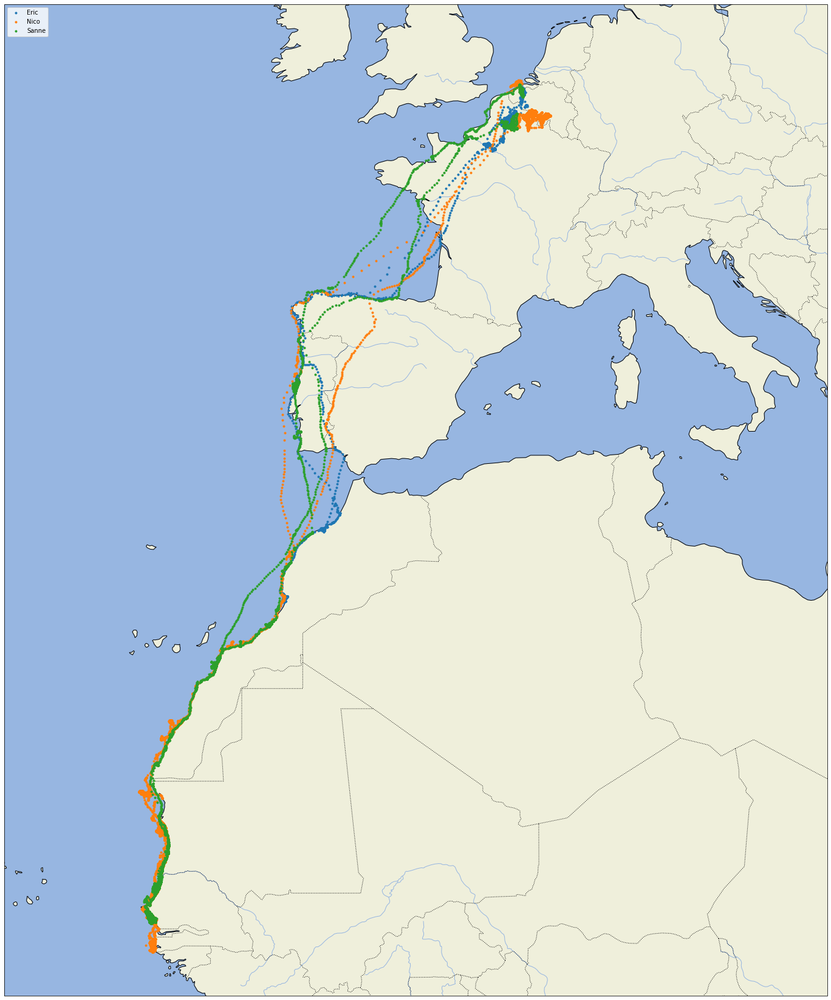

In [35]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
proj = ccrs.Mercator()
plt. figure( figsize=(30,30))
ax = plt.axes(projection=proj)
ax.set_extent((-25.0, 20.0, 52.0, 10.0))

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')

ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.STATES)
ax.add_feature(cfeature.BORDERS, linestyle=":")
ax.add_feature(states_provinces, edgecolor='gray')

for name in bird_names:
    ix = birddata['bird_name'] == name
    x, y = birddata. longitude[ix], birddata. latitude[ix]
    ax.plot(x, y, '.', transform=ccrs.Geodetic(), label=name)
plt. legend(loc="upper left") 
plt.savefig("map.png")